In [2]:
import sys
sys.path.append('../')
from Driver import Driver
from Race import Race
from TMEasy import Tire
from Vehicle import Vehicle
from Track import Track
from Function import Function
import numpy as np

pygame 2.0.1 (SDL 2.0.14, Python 3.8.8)
Hello from the pygame community. https://www.pygame.org/contribute.html


In [3]:
%load_ext autoreload
%autoreload 2

# Input data

## Tires

In [4]:
radius = 0.35
mass = 13.44
Jz_tire = 1
cz = 392000
dfx0 = 100000
dfy0 = 80000
fxm = 3900
fym = 3650
sxm = 0.11
sym = 0.16
fxs = 3600
fys = 3600
sxs = 0.4
s_ys = 0.5
n2L0 = 0.18
sy0 = 0.19
syE = 0.35
lamb = 2/3
frr = 0.015
TMEasy = Tire(radius, mass, Jz_tire, cz, dfx0, dfy0, fxm, fym, sxm, sym, fxs, fys, sxs, s_ys, sy0, syE, lamb, n2L0, frr)
TMEasy.all_info()

Vertical force considered: 16000N
Camber slip = 0.00
Bore slip = 0.00


Coenering stiffness = 1186.9N/৹


## Driver

In [5]:
driver = Driver(accelerator='PID', steering='DLC')

Double Lane-Change defined.


## Track

In [6]:
hx = 0
hy = 0
wx = 0.1
wy = 100
# mean = 0
# variance = 1

zf = lambda x, y: hx * np.sin(wx * x) + hy * np.sin(wy * y) #+ 0.01 * np.sin(10*x)
vzf = lambda x, vx, y, vy: hx * wx * vx * np.cos(wx * x) + hy * wy * vy * np.cos(wy * y)

track = Track(zf, vzf)
# track.set_noise(mean, variance)
# track.profile(x=[0, 1000], y=[0,100], resolution=1)

## Vehicle + Suspension

In [7]:
vehicle_mass = 265
Ixx = 50
Iyy = 91.8
Izz = 91.8
lf = 1.15
lr = 1.2
wf = 1.53
wr = 1.53
af = 0.9
cd = 1.34
CG_height = 0.278
car = Vehicle(TMEasy, vehicle_mass, Ixx, Iyy, Izz, lf, lr, wf, wr, af, cd, CG_height)

In [8]:
K_sf = 55861
K_sr = 43633
C_sf = 0.3 * np.sqrt(K_sf * Iyy)
C_sr = 0.3 * np.sqrt(K_sr * Iyy)
car.set_suspension(K_sf, K_sr, C_sf, C_sr)

# G = 186e9
# df = 0.012095179
# af = 0.25
# bf = 0.54
car.set_anti_roll_bar('f', K_arz=280.51)

# dr = 0.013
# ar = 0.3
# br = 0.8
car.set_anti_roll_bar('r', K_arz=596.31)

# gamma1 = np.deg2rad(0) # O ângulo de cambagem positivo joga o carro para a direita
# gamma2 = np.deg2rad(0)
# gamma3 = 0.6
# gamma4 = 0.63
# car.set_camber(gamma1, gamma2, gamma3, gamma4)

Anti-roll Bar (front) = 4.9 Nm/৹
Anti-roll Bar (rear)  = 10.4 Nm/৹


596.31

## Simulation

In [9]:
sim = Race(car, driver, track, max_time=40, rtol=1e-3, atol=1e-3, max_step=1e-3)
sim.post_process()

Solution Finished
Double Lane-Change defined.


# Comparison with Adams

In [10]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from Function import Function

## Auxiliar Functions

In [11]:
def normalize_angle(angle):
    """
    function to reduce an angle to its equivalent value in the unit circle
    """
    unit_angle = np.modf(angle / (2 * np.pi))[0] * 2 * np.pi
    if unit_angle < 0:
        unit_angle += 2 * np.pi

    return unit_angle

def standard_angle(angle):
    """
    function to make the andgle function continuous
    """
    unit_angle = np.copy(angle)
    for i in range(1, len(unit_angle)):
        if unit_angle[i-1] > 0 and unit_angle[i] < 0:
            unit_angle[i] += 2 * np.pi

    return unit_angle

def calcula_dot(f, t):
    n = len(f)
    df = np.zeros(n)
    
    for i in range(n):
        if i == 0:
            df[i] = (-f[i+2] + 4 * f[i+1] - 3 * f[i]) / (2 * (t[i+1] - t[i]))
        elif i == n-1:
            df[i] = (3 * f[i] - 4 * f[i-1] + f[i-2]) / (2 * (t[i] - t[i-1]))
        else:
            df[i] = (f[i+1] - f[i-1]) / (2 * (t[i] - t[i-1]))
            
    return df

def calcula_dot_dot(f, t):
    n = len(f)
    ddf = np.zeros(n)
    
    for i in range(n):
        if i == 0:
            ddf[i] = (-f[i+3] + 4 * f[i+2] - 5 * f[i+1] + 2 * f[i]) / ((t[i+1] - t[i])**2)
        elif i == n-1:
            ddf[i] = (2 * f[i] - 5 * f[i-1] + 4 * f[i-2] - f[i-3]) / ((t[i] - t[i-1])**2)
        else:
            ddf[i] = (f[i+1] - 2 * f[i] + f[i-1]) / ((t[i+1] - t[i])**2)
            
    return ddf

## Importing data

In [12]:
'''
A.  .EPR_FV01.ISOv60_dlc.chassis_displacements.lateral (mm)
B.  .EPR_FV01.ISOv60_dlc.chassis_displacements.longitudinal (mm)
C.  .EPR_FV01.ISOv60_dlc.chassis_displacements.pitch (deg)
D.  .EPR_FV01.ISOv60_dlc.chassis_displacements.roll (deg)
E.  .EPR_FV01.ISOv60_dlc.chassis_displacements.TIME (sec)
'''
data = pd.read_csv("FSAE_data/ISOv60.txt", sep=',')#, delimiter='\n')
data.head()

,A,B,C,D,E
0,0.000000,-552.44290,-0.128390,0.0,0.01
1,0.000004,-385.78860,-0.128351,0.0,0.02
2,0.000034,-219.13500,-0.128310,0.0,0.03
3,0.000141,-52.48171,-0.128270,0.0,0.04
4,0.000408,114.17190,-0.128231,0.0,0.05


In [13]:
'''
A.  .EPR_FV01.ISOv60_dlc.chassis_displacements.vertical (mm)
B.  .EPR_FV01.ISOv60_dlc.chassis_displacements.yaw (deg)
'''
data2 = pd.read_csv("FSAE_data/ISOv60_2.txt", sep=',')#, delimiter='\n')
data2.head()

,A,B
0,240.5235,0.0
1,240.5235,0.0
2,240.5235,0.0
3,240.5236,0.0
4,240.5237,0.0


In [14]:
t_a = np.array(data['E'])
x = np.array(data['B']) / 1000
y = np.array(data['A']) / 1000
z = np.array(data2['A']) / 1000
roll = np.array(data['D'])
pitch = np.array(data['C'])
yaw = np.array(data2['B'])

## Generating Functions

In [15]:
f_x = Function(t_a, x, 'Time (s)', 'Longitudinal Displacement (m)', 'x', method='linear')
f_y = Function(t_a, y, 'Time (s)', 'Lateral Displacement (m)', 'y', method='linear')
f_z = Function(t_a, z, 'Time (s)', 'Vertical Displacement (m)', 'z', method='linear')
f_roll = Function(t_a, roll, 'Time (s)', 'Roll angle (deg)', 'roll', method='linear')
f_pitch = Function(t_a, pitch, 'Time (s)', 'Pitch angle (deg)', 'pitch', method='linear')
f_yaw = Function(t_a, yaw, 'Time (s)', 'Yaw angle (deg)', 'yaw', method='linear')
plt.style.use('science')

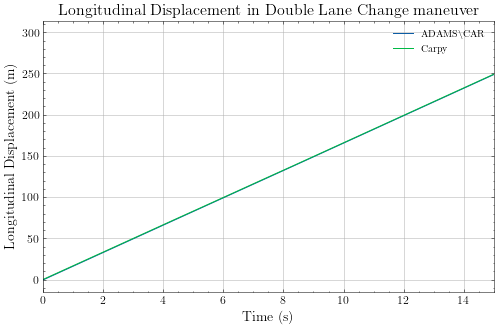

In [16]:
t_c = t_a + 20 - 3.3
plt.figure(figsize=(8.09, 5))
plt.plot(t_a, f_x(t_a), label='adams')
plt.plot(t_a, sim.x(t_c) - sim.x(t_c[0]), label='carpy')
plt.legend([r'ADAMS$\backslash$CAR', 'Carpy'])
plt.xlabel('Time (s)', fontsize=14)
plt.ylabel('Longitudinal Displacement (m)', fontsize=14)
plt.title('Longitudinal Displacement in Double Lane Change maneuver', fontsize=16)
plt.grid()
plt.xlim(0, 15)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.savefig('Figuras/DLC_longitudinal_displacement.pdf')
plt.show()

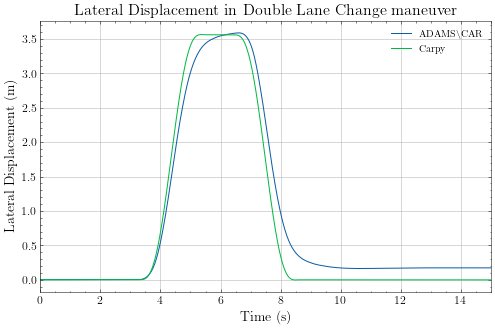

In [17]:
plt.figure(figsize=(8.09, 5))
plt.plot(t_a, -f_y(t_a), label='adams')
plt.plot(t_a, sim.y(t_c), label='carpy')
plt.legend([r'ADAMS$\backslash$CAR', 'Carpy'])
plt.xlabel('Time (s)', fontsize=14)
plt.ylabel('Lateral Displacement (m)', fontsize=14)
plt.title('Lateral Displacement in Double Lane Change maneuver', fontsize=16)
plt.grid()
plt.xlim(0, 15)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.savefig('Figuras/DLC_lateral_displacement.pdf')
plt.show()

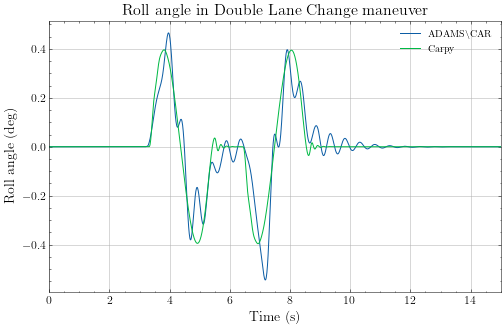

In [18]:
plt.figure(figsize=(8.09, 5))
plt.plot(t_a, -f_roll(t_a), label='adams')
plt.plot(t_a, sim.phi(t_c), label='carpy')
plt.legend([r'ADAMS$\backslash$CAR', 'Carpy'])
plt.xlabel('Time (s)', fontsize=14)
plt.ylabel('Roll angle (deg)', fontsize=14)
plt.title('Roll angle in Double Lane Change maneuver', fontsize=16)
plt.grid()
plt.xlim(0, 15)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.savefig('Figuras/DLC_roll_angle.pdf')
plt.show()

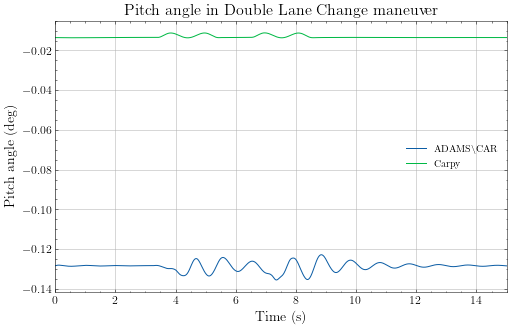

In [19]:
plt.figure(figsize=(8.09, 5))
plt.plot(t_a, f_pitch(t_a), label='adams')
plt.plot(t_a, sim.theta(t_c), label='carpy')
plt.legend([r'ADAMS$\backslash$CAR', 'Carpy'])
plt.xlabel('Time (s)', fontsize=14)
plt.ylabel('Pitch angle (deg)', fontsize=14)
plt.title('Pitch angle in Double Lane Change maneuver', fontsize=16)
plt.grid()
plt.xlim(0, 15)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.savefig('Figuras/DLC_pitch_angle.pdf')
plt.show()

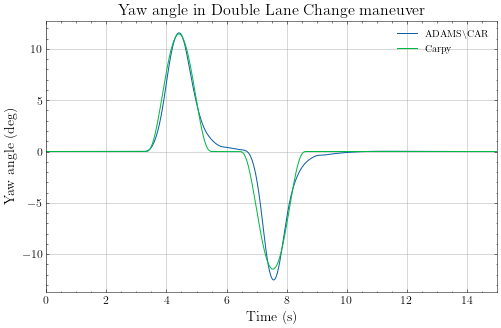

In [20]:
plt.figure(figsize=(8.09, 5))
plt.plot(t_a, f_yaw(t_a), label='adams')
plt.plot(t_a, sim.psi(t_c), label='carpy')
plt.legend([r'ADAMS$\backslash$CAR', 'Carpy'])
plt.xlabel('Time (s)', fontsize=14)
plt.ylabel('Yaw angle (deg)', fontsize=14)
plt.title('Yaw angle in Double Lane Change maneuver', fontsize=16)
plt.grid()
plt.xlim(0, 15)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.savefig('Figuras/DLC_yaw_angle.pdf')
plt.show()

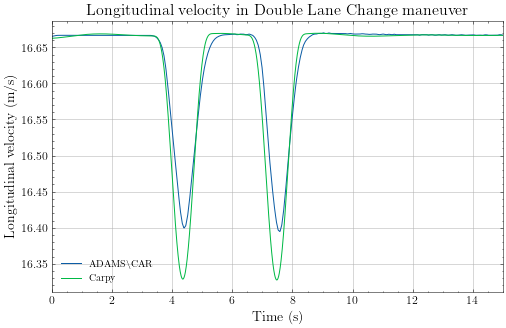

In [21]:
tt = np.linspace(0, t_a[-1], 300)

vx = calcula_dot(f_x(tt), tt)
vy = calcula_dot(f_y(tt), tt)
vz = calcula_dot(f_z(tt), tt)

f_vx = Function(tt, vx, 'Time (s)', 'Longitudinal Velocity (m/s)', 'vx', method='linear')
f_vy = Function(tt, vy, 'Time (s)', 'Lateral Velocity (m/s)', 'vy', method='linear')
f_vz = Function(tt, vz, 'Time (s)', 'Vertical Velocity (m/s)', 'vz', method='linear')
f_v = Function(tt, np.sqrt(vx**2 + vy**2), 'Time (s)', 'Velocity (m/s)', 'v', method='linear')

plt.figure(figsize=(8.09, 5))
plt.plot(t_a, f_vx(t_a), label='adams')
plt.plot(t_a, sim.vx(t_c), label='carpy')
plt.legend([r'ADAMS$\backslash$CAR', 'Carpy'])
plt.xlabel('Time (s)', fontsize=14)
plt.ylabel('Longitudinal velocity (m/s)', fontsize=14)
plt.title('Longitudinal velocity in Double Lane Change maneuver', fontsize=16)
plt.grid()
plt.xlim(0, 15)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.savefig('Figuras/DLC_longitudinal_velocity.pdf')
plt.show()

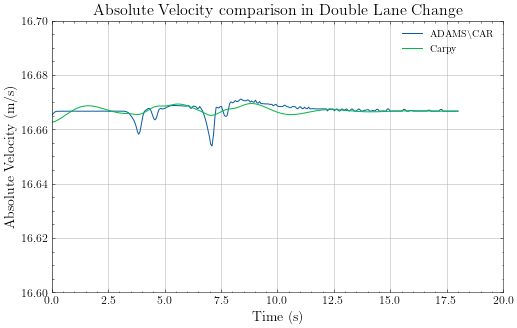

In [22]:
plt.figure(figsize=(8.09, 5))
plt.plot(t_a, f_v(t_a), label='adams')
plt.plot(t_a, np.sqrt(sim.vx(t_c)**2 + sim.vy(t_c)**2 + sim.vz(t_c)**2), label='carpy')
plt.legend([r'ADAMS$\backslash$CAR', 'Carpy'])
plt.xlabel('Time (s)', fontsize=14)
plt.ylabel('Absolute Velocity (m/s)', fontsize=14)
plt.title('Absolute Velocity comparison in Double Lane Change', fontsize=16)
plt.grid()
plt.xlim(0, 20)
plt.ylim(16.6, 16.7)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.savefig('Figuras/DLC_absolute_velocity.pdf')
plt.show()

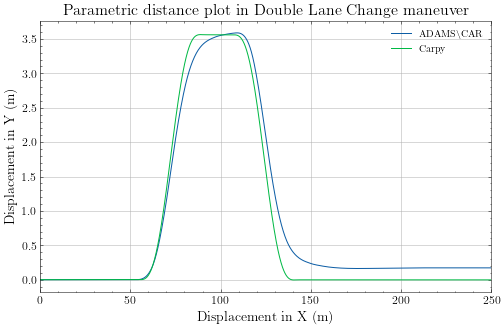

In [23]:
# f_xy_carpy = Function(sim.x(t_c) - sim.x(t_c[0]), sim.y(t_c), 'x (m)', 'y (m)', 'Carpy', method='cubicSpline')
# f_xy_adams = Function(f_x(t_a), -f_y(t_a), 'x (m)', 'y (m)', r'ADAMS$\backslash$CAR', method='cubicSpline')
# f_xy_adams.compara2Plots(f_xy_carpy, 'Double Lane Change maneuver')

plt.figure(figsize=(8.09, 5))
plt.plot(f_x(t_a), -f_y(t_a), label='adams')
plt.plot(sim.x(t_c) - sim.x(t_c[0]), sim.y(t_c), label='carpy')
plt.legend([r'ADAMS$\backslash$CAR', 'Carpy'])
plt.xlabel('Displacement in X (m)', fontsize=14)
plt.ylabel('Displacement in Y (m)', fontsize=14)
plt.title('Parametric distance plot in Double Lane Change maneuver', fontsize=16)
# plt.axis('equal')
plt.grid()
plt.xlim(0, 250)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.savefig('Figuras/DLC_parameric_plot.pdf')
plt.show()

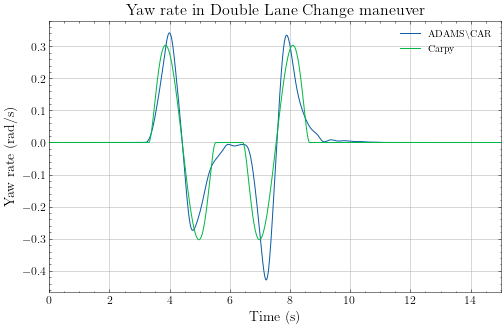

In [24]:
d_yaw = np.deg2rad(calcula_dot(f_yaw(tt), tt))
f_d_yaw = Function(tt, d_yaw, 'Time (s)', 'Yaw velocity (rad/s)', 'd_yaw', method='cubicSpline')

plt.figure(figsize=(8.09, 5))
plt.plot(t_a, f_d_yaw(t_a), label='adams')
plt.plot(t_a, sim.psi_dot(t_c), label='carpy')
plt.legend([r'ADAMS$\backslash$CAR', 'Carpy'])
plt.xlabel('Time (s)', fontsize=14)
plt.ylabel('Yaw rate (rad/s)', fontsize=14)
plt.title('Yaw rate in Double Lane Change maneuver', fontsize=16)
plt.grid()
plt.xlim(0, 15)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.savefig('Figuras/DLC_yaw_rate.pdf')
plt.show()

In [27]:
ax = calcula_dot_dot(f_x(tt), tt)
ay = calcula_dot_dot(f_y(tt), tt)
az = calcula_dot_dot(f_z(tt), tt)

f_ax = Function(tt, ax, 'Time (s)', 'Longitudinal Acceleration (m/s²)', 'ax', method='cubicSpline')
f_ay = Function(tt, ay, 'Time (s)', 'Lateral Acceleration (m/s²)', 'ay', method='cubicSpline')
f_az = Function(tt, az, 'Time (s)', 'Vertical Acceleration (m/s²)', 'az', method='cubicSpline')

In [28]:
def rotation_matrix(phi, theta, psi):
    c11 = np.cos(theta) * np.cos(psi)
    c12 = np.cos(theta) * np.sin(psi)
    c13 = -np.sin(theta)
    c21 = np.sin(phi) * np.sin(theta) * np.cos(psi) - np.cos(phi) * np.sin(psi)
    c22 = np.sin(phi) * np.sin(theta) * np.sin(psi) + np.cos(phi) * np.cos(psi)
    c23 = np.sin(phi) * np.cos(theta)
    c31 = np.cos(phi) * np.sin(theta) * np.cos(psi) + np.sin(phi) * np.sin(psi)
    c32 = np.cos(phi) * np.sin(theta) * np.sin(psi) - np.sin(phi) * np.cos(psi)
    c33 = np.cos(phi) * np.cos(theta)
    return np.array([[c11, c12, c13], [c21, c22, c23], [c31, c32, c33]])

In [29]:
avx_a = np.zeros(len(t_a))
avy_a = np.zeros(len(t_a))
avz_a = np.zeros(len(t_a))

for i in range(len(t_a)):
    # Mount rotation matrix
    C_a = rotation_matrix(0, 0, -np.deg2rad(f_yaw(t_a[i])))
    # Get velocities in vehicle coordinate system
    [avx_a[i], avy_a[i], avz_a[i]] = C_a @ [f_ax(t_a[i]), f_ay(t_a[i]), f_az(t_a[i])]

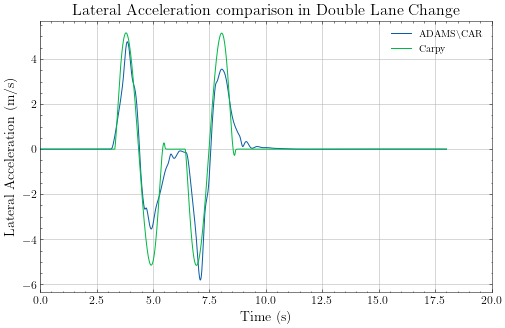

In [30]:
plt.figure(figsize=(8.09, 5))
plt.plot(t_a, -avy_a, label='adams')
plt.plot(t_a, sim.avy(t_c), label='carpy')
plt.legend([r'ADAMS$\backslash$CAR', 'Carpy'])
plt.xlabel('Time (s)', fontsize=14)
plt.ylabel('Lateral Acceleration (m/s)', fontsize=14)
plt.title('Lateral Acceleration comparison in Double Lane Change', fontsize=16)
plt.grid()
plt.xlim(0, 20)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.savefig('Figuras/DLC_lateral_acceleration.pdf')
plt.show()